# Denoising filter testing
## required libaries

In [109]:
import os, time, cv2, math
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import normalized_root_mse as nrmse
from skimage import exposure

##remove root windows
#import tkinter as tk
#from tkinter import filedialog
#root = tk.Tk()
#root.withdraw()

home_dir = os.path.abspath("")

## load files

In [ ]:
#filepath_noisy = filedialog.askopenfilename(title='Please select the image',filetypes=[("Tiff images", "*.tif;*.tiff")])
filepath_noisy  = home_dir + os.sep + 'LQ.tiff'
filepath_target = home_dir + os.sep + 'HQ.tiff'
filepath_guide  = home_dir + os.sep + 'guided.tiff'

image_noisy  = cv2.imread( filepath_noisy , cv2.IMREAD_GRAYSCALE )
image_target = cv2.imread( filepath_target, cv2.IMREAD_GRAYSCALE )
image_guide  = cv2.imread( filepath_guide , cv2.IMREAD_GRAYSCALE )

## get a subsection of the image

In [ ]:
h = image_noisy.shape[0]
w = image_noisy.shape[1]

image_noisy  = image_noisy[  :int(h/2), int(w/2):w-1 ]
image_target = image_target[ :int(h/2), int(w/2):w-1 ]
image_guide  = image_guide[  :int(h/2), int(w/2):w-1 ]

## Show the loaded images

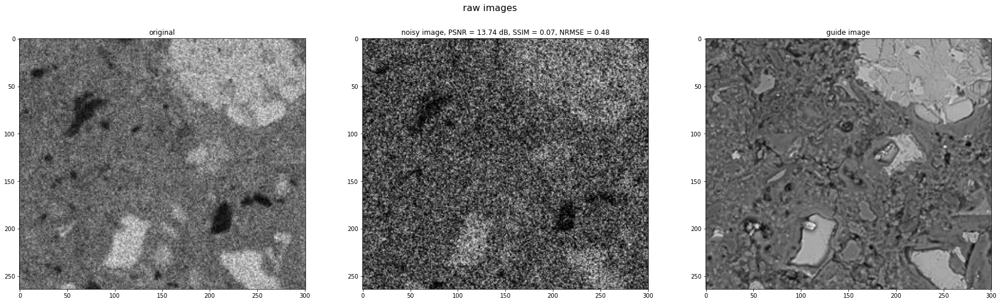

In [110]:
fig, ax = plt.subplots(1,3, figsize=(30, 8))
fig.suptitle('raw images', fontsize=16)

ax[0].imshow(image_target, cmap='gray')
ax[0].set_title( "original" )

ax[1].imshow(image_noisy, cmap='gray')
ax[1].set_title(
	"noisy image, PSNR = {:.2f} dB, SSIM = {:.2f}, NRMSE = {:.2f}".format( 
		psnr(image_target, image_noisy),
		ssim(image_target, image_noisy),
		nrmse(image_target, image_noisy)
	)
)

ax[2].imshow(image_guide, cmap='gray')
ax[2].set_title( "guide image" )

plt.show()

## denoising filter wrappers

In [111]:
# filter wrappers

def denoiseNLMCV2( image, h=15, templateWindowSize=7, searchWindowSize=23 ):
    denoised = np.zeros(image.shape, np.uint8) # empty image
    cv2.fastNlMeansDenoising( image, denoised, float( h ), templateWindowSize, searchWindowSize )

    return denoised

def denoiseBilateralCV2( image, d = 15 ):
    return cv2.bilateralFilter( image, d, sigmaColor = 80, sigmaSpace = 80, borderType = cv2.BORDER_DEFAULT )

#https://stackoverflow.com/questions/14715817/emgu-cv-anisotropic-diffusion
def anisotropicDiffusion( image, alpha=0.075 ):
	#alpha  - max value of .25 for stability
	#K	    - conduction coefficient 20-100
	#niter  - number of iterations
	#alpha=0.075
	K = 80
	niters=30 #as stated in appendix 2
	image = cv2.cvtColor( image,cv2.COLOR_GRAY2RGB )
	denoised = cv2.ximgproc.anisotropicDiffusion( image, alpha ,K , niters )
	
	return cv2.cvtColor(denoised, cv2.COLOR_RGB2GRAY)

def GuidedFilter( guide_image, image, radius = 2 ):
	denoised = np.zeros(image.shape, np.uint8) # empty image
	denoised = cv2.ximgproc.guidedFilter( guide_image, image, int( radius ), eps = 0.1 )
	return denoised

# DOI: 10.5220/0006509000850094
def edgePreservingFilter( image, d = 2 ):
	image = cv2.cvtColor( image,cv2.COLOR_GRAY2RGB )
	denoised = cv2.ximgproc.edgePreservingFilter( image, int(d) , threshold = float( 80 ) )
	return cv2.cvtColor(denoised, cv2.COLOR_RGB2GRAY)

## contrast enhancement functions

In [112]:
#https://stackoverflow.com/questions/45932330/logarithmic-contrast-enhancement-of-an-image-in-python
def log_enh2( image ):
    width, height = image.shape[:2]
    
    enhanced_image=np.zeros_like(image)
    InputMax=np.amax(image)
    InputMin=np.amin(image)
    
    a = 255/(InputMax-InputMin)
    b = 255-(a*InputMax)

    for j in range(width):
        for i in range(height):
            pixel = a * math.log10( image[j, i] ) + b if ( image[j, i] != 0 ) else 0
            enhanced_image[j, i] = pixel

    return enhanced_image

# the gain is manually selected to get the best matching results...
def log_enh( image ):
    return exposure.adjust_log( image, gain=1.2 )

## parameters to test

In [ ]:
try_filters = {
	'edge preserving filter' : {
		'par'  : 'd',
		'min'  : 3,
		'max'  : 9,
		'step' : 1
	},
	'non local means denoising' : {
		'par'  : 'h',
		'min'  : 18,
		'max'  : 24,
		'step' : 1
	},
	'bilateral filter' : {
		'par'  : 'd',
		'min'  : 9,
		'max'  : 21,
		'step' : 2
	},
	'anisotropic diffusion' : {
		'par'  : 'alpha',
		'min'  : 0.015,
		'max'  : 0.075,
		'step' : 0.01
	},
	'guided filter' : {
		'par'  : 'radius',
		'min'  : 1,
		'max'  : 7,
		'step' : 1
	},
	'gauss filter' : {
		'par'  : 'kernel',
		'min'  : 3,
		'max'  : 15,
		'step' : 2 #resulting kernel values have to be odd!
	}
}

## functions to test the filters

In [113]:
def test_filter( image_noisy, image_target, filter_name, filter_data, debug=False ):
	pos = 0
	denoised_images = []
	psnr_results	= []
	ssim_results	= []
	nrmse_results	= []
	time_results	= []
	for par in np.arange(filter_data['min'], filter_data['max'], filter_data['step']):
		t1 = time.time()

		if ( filter_name == 'non local means denoising' ):
			denoised_images.append( denoiseNLMCV2( image_noisy, par ) )
		elif ( filter_name == 'bilateral filter' ):
			denoised_images.append( denoiseBilateralCV2( image_noisy, par ) )
		elif ( filter_name == 'anisotropic diffusion' ):
			denoised_images.append( anisotropicDiffusion( image_noisy, par ) )
		elif ( filter_name == 'guided filter' ):
			denoised_images.append( GuidedFilter( image_guide, image_noisy, par ) ) # guide image is taken from global scope!
		elif ( filter_name == 'edge preserving filter' ):
			denoised_images.append( edgePreservingFilter( image_noisy, par ) )
		elif ( filter_name == 'gauss filter' ):
			denoised_images.append( cv2.GaussianBlur(image_noisy, (par,par), cv2.BORDER_DEFAULT ) )

		denoised_images[pos] = log_enh( denoised_images[pos] )

		psnr_results.append(  psnr(image_target, denoised_images[pos]) )
		ssim_results.append(  ssim(image_target, denoised_images[pos]) )
		nrmse_results.append( nrmse(image_target, denoised_images[pos]) )
		
		time_results.append( (time.time() - t1) )

		if debug:
			print( " denoising image using \"{}\" ({}={}) took {:.2f} s".format( filter_name, filter_data['par'], par, (time.time() - t1) ) )
			print( "    PSNR = {:.2f} dB, SSIM = {:.2f}, NRMSE = {:.2f}\n".format( psnr_results[pos],  ssim_results[pos], nrmse_results[pos] ) )

		pos += 1
	
	return denoised_images, psnr_results, ssim_results, nrmse_results, time_results

def show_filter_results( filter_name, filter_data , denoised_images, psnr_results, ssim_results, nrmse_results, time_results ):
	img_cnt = int( np.floor((filter_data['max'] - filter_data['min'])/filter_data['step']) )
	columns = 3
	rows = int(np.ceil(img_cnt/columns))
	fig, ax = plt.subplots(rows, columns, figsize=(9*columns, 8*rows))
	#fig.suptitle('compare parameters of {} ({}={} ... {})'.format(filter_name, filter_data['par'], filter_data['min'], (filter_data['max']-filter_data['step'])), fontsize=16)
	fig.subplots_adjust(top=0.92)

	pos = 0
	for par in np.arange(filter_data['min'], filter_data['max'], filter_data['step']):
		y_pos = pos%columns
		x_pos = int(np.floor(pos/columns))
		
		im = ax[x_pos, y_pos].imshow(denoised_images[pos], cmap='gray')
		ax[x_pos, y_pos].set_title(
			"{}, {}={}\nPSNR = {:.2f} dB, SSIM = {:.2f}, NRMSE = {:.2f}, took {:.2f} s".format( 
				filter_name,
				filter_data['par'],
				round(par, 4),
				psnr_results[pos],
				ssim_results[pos],
				nrmse_results[pos],
				time_results[pos]
			)
		)
		pos += 1
		
		ax[x_pos, y_pos].axis('off')
	plt.axis('off')
	plt.tight_layout(h_pad=5, w_pad=1)
	plt.savefig( home_dir + os.sep + "test-{}_{}={}-{}.png".format( filter_name, filter_data['par'], filter_data['min'], filter_data['max'] ),facecolor='white', transparent=False, bbox_inches = 'tight', pad_inches = 0.01 )
	plt.show()

## actually test all selected filters

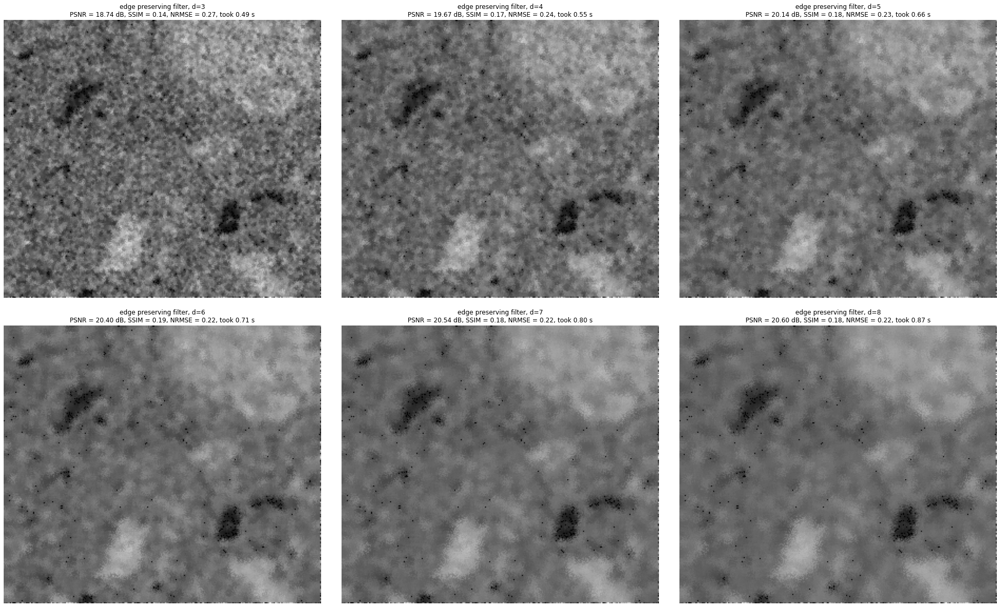

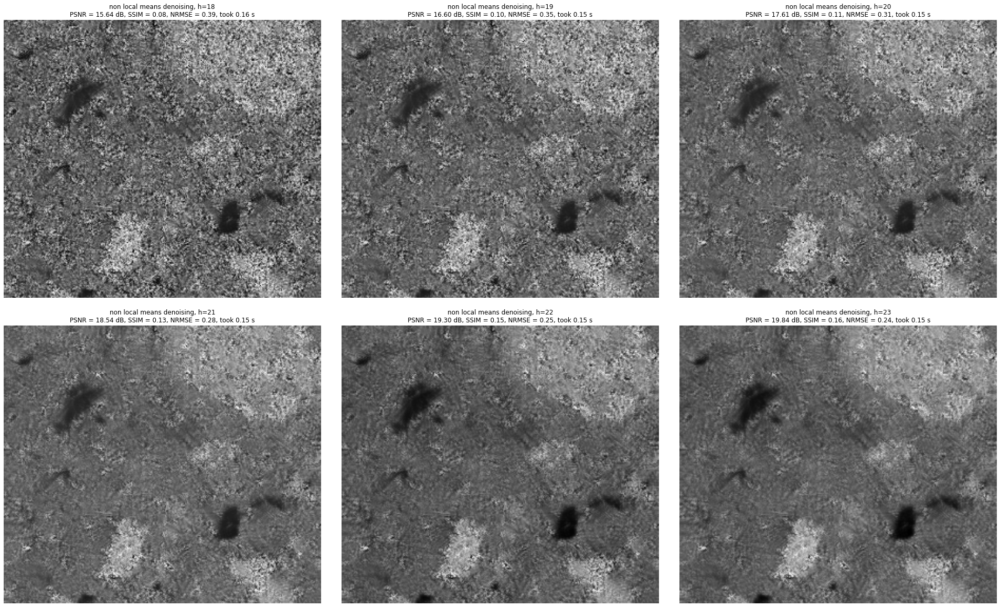

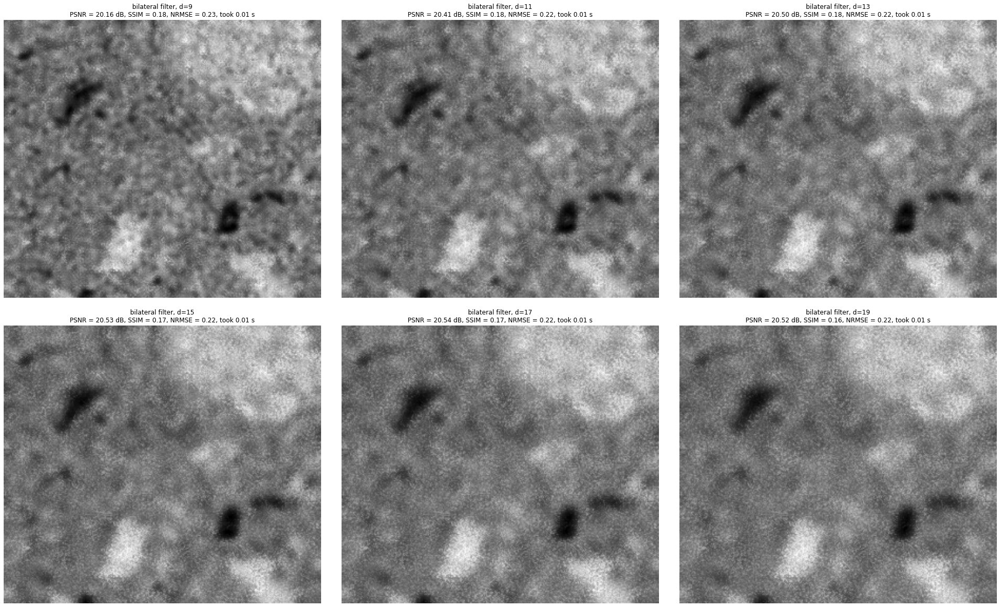

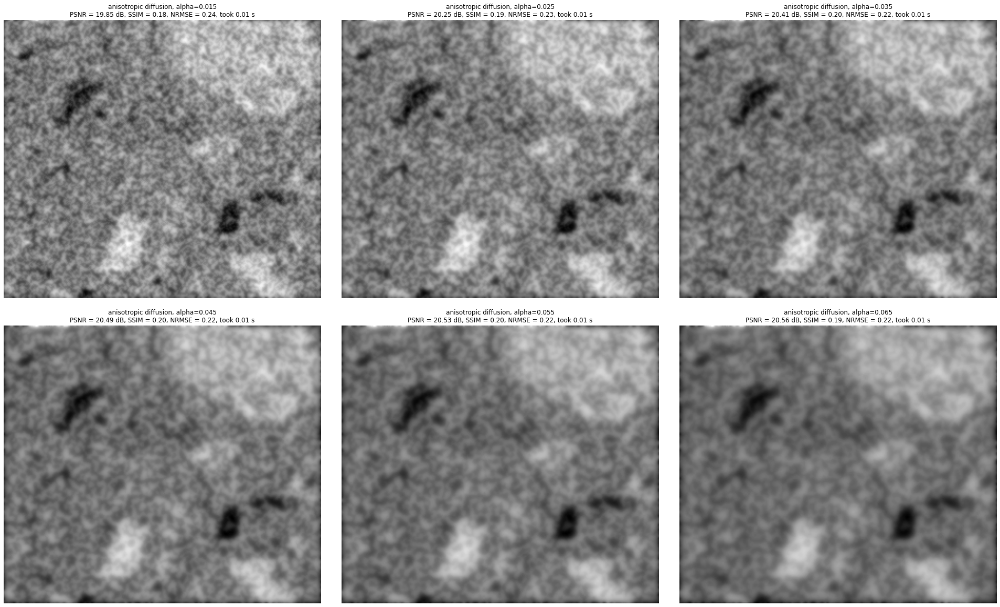

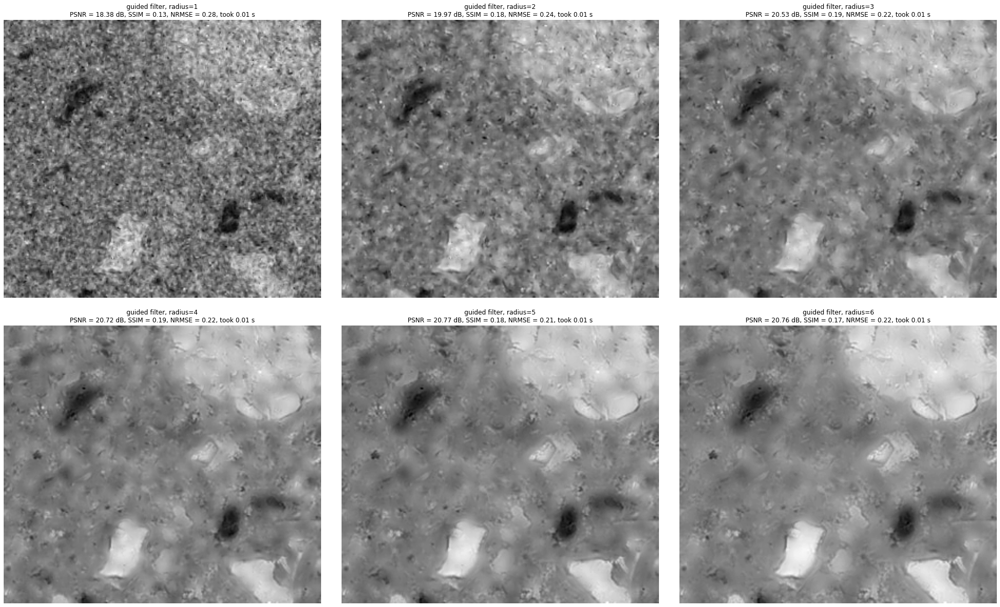

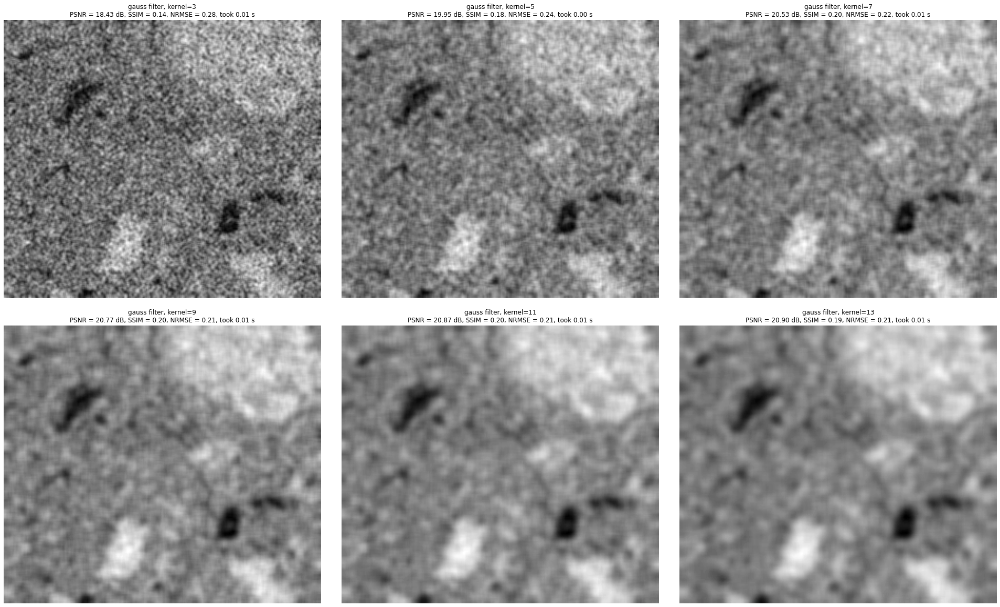

In [114]:
debug = False
for filter_name, filter_data in try_filters.items():
	denoised_images, psnr_results, ssim_results, nrmse_results, time_results = test_filter( image_noisy, image_target, filter_name, filter_data, debug )
	show_filter_results( filter_name, filter_data , denoised_images, psnr_results, ssim_results, nrmse_results, time_results )

## compare the different filters using manually selected settings

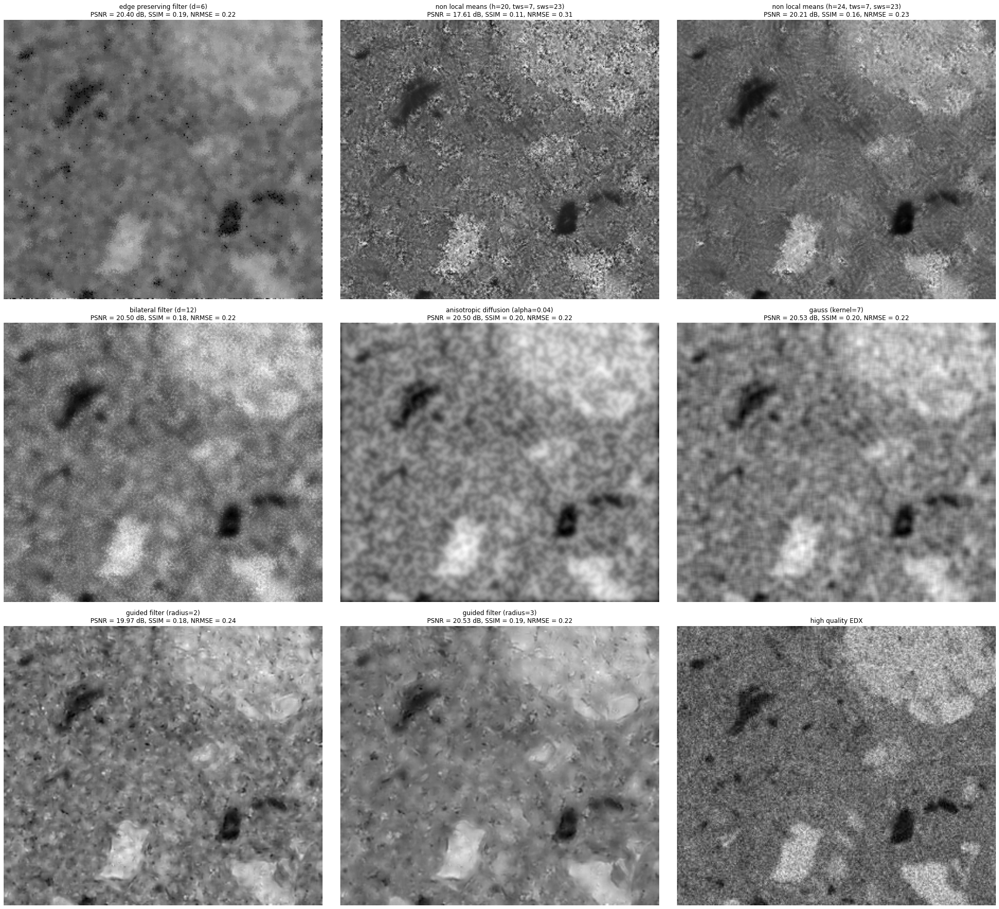

In [115]:
selected_denoised_images = [
	#image_noisy,
	edgePreservingFilter( image_noisy, 6 ),
	denoiseNLMCV2( image_noisy, h=20 ),
	denoiseNLMCV2( image_noisy, h=24, templateWindowSize=7, searchWindowSize=23 ),
	denoiseBilateralCV2( image_noisy, d=12 ),
	anisotropicDiffusion( image_noisy, alpha=0.04 ),
	cv2.GaussianBlur(image_noisy, (7,7), cv2.BORDER_DEFAULT),
	GuidedFilter( image_guide, image_noisy, 2 ),
	GuidedFilter( image_guide, image_noisy, 3 ),
	image_target
]

filter_names = [
	#'low quality EDX',
	'edge preserving filter (d=6)',
	'non local means (h=20, tws=7, sws=23)',
	'non local means (h=24, tws=7, sws=23)',
	'bilateral filter (d=12)',
	'anisotropic diffusion (alpha=0.04)',
	'gauss (kernel=7)',
	'guided filter (radius=2)',
	'guided filter (radius=3)',
	'high quality EDX'
]

img_cnt = len(selected_denoised_images)

columns = 3
rows = int(np.ceil(img_cnt/columns))

fig, ax = plt.subplots(rows, columns, figsize=(9*columns, 8*rows))
#fig.suptitle('comparison of different denoising filters', fontsize=16)
fig.subplots_adjust(top=0.96),

for pos in range(0, img_cnt, 1):
	y_pos = pos%columns
	x_pos = int(np.floor(pos/columns))
	
	if ( pos != 8 ): # pos != 0 and
		image_denoised = log_enh( selected_denoised_images[pos] )
		im = ax[x_pos, y_pos].imshow(image_denoised, cmap='gray')
		ax[x_pos, y_pos].set_title(
			"{}\nPSNR = {:.2f} dB, SSIM = {:.2f}, NRMSE = {:.2f}".format( 
				filter_names[pos],
				psnr(  image_target, image_denoised ),
				ssim(  image_target, image_denoised ),
				nrmse( image_target, image_denoised )
			)
		)
	else:
		im = ax[x_pos, y_pos].imshow( selected_denoised_images[pos], cmap='gray' )
		ax[x_pos, y_pos].set_title( filter_names[pos] )
		
	ax[x_pos, y_pos].axis('off')
	
plt.tight_layout(h_pad=5, w_pad=1)
plt.savefig( home_dir + os.sep + "selected_parameters.png", facecolor='white', transparent=False, bbox_inches = 'tight', pad_inches = 0.1 )
plt.show()



## Compare the histograms before and after applying log_enh()

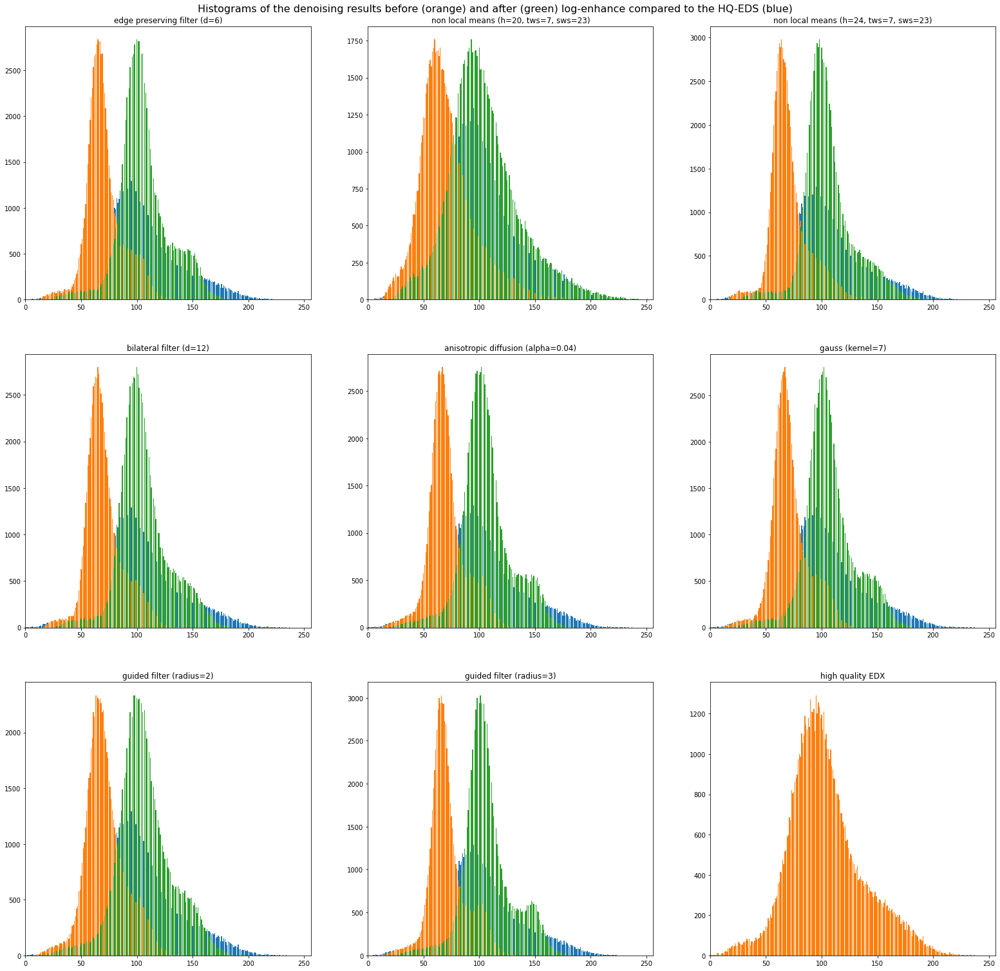

In [116]:
fig, ax = plt.subplots(rows, columns, figsize=(9*columns, 8*rows))
fig.suptitle('Histograms of the denoising results before (orange) and after (green) log-enhance compared to the HQ-EDS (blue)', fontsize=16)
fig.subplots_adjust(top=0.96)

for pos in range(0, img_cnt, 1):
	y_pos = pos%columns
	x_pos = int(np.floor(pos/columns))

	#print( round(np.mean(selected_denoised_images[pos]), 3), round(np.median(selected_denoised_images[pos]), 3), round(np.average(selected_denoised_images[pos]), 3) )

	hist, bin_edges = np.histogram( selected_denoised_images[8].ravel(), bins = np.linspace(0, 255, 256))
	ax[x_pos, y_pos].bar( bin_edges[:-1], hist )

	hist, bin_edges = np.histogram( selected_denoised_images[pos].ravel(), bins = np.linspace(0, 255, 256))
	ax[x_pos, y_pos].bar( bin_edges[:-1], hist )
	if ( pos != 8  ):
		selected_denoised_images[pos] = log_enh( selected_denoised_images[pos] )
		
		hist, bin_edges = np.histogram( selected_denoised_images[pos].ravel(), bins = np.linspace(0, 255, 256))
		ax[x_pos, y_pos].bar( bin_edges[:-1], hist )

	ax[x_pos, y_pos].set_xlim(0,256)
	ax[x_pos, y_pos].set_title( filter_names[pos] )
	
plt.savefig( home_dir + os.sep + "histograms.png", facecolor='white', transparent=False, bbox_inches = 'tight', pad_inches = 0.1 )
plt.show()